# Is it called DS?

In this notebook I'll try to make some Data Analysis. All datasets are property of bgp204.

EDA --> cleaning, correlation analysis, multivariate index analysis

Polynomial regression

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

In [4]:
df = pd.read_csv(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\ГИПЕРСУПЕРТАБЛИЧКА - Лист1.csv", encoding='utf-8')
df = df.fillna(0)
df = df.rename({'P buildings_index': 'P_buildings_index'}, axis=1)
print(df.shape)
df.head()

(73, 19)


,№,LN_type_1,S natural (%),S artificial (%),S buildings (%),P buildings (sqm/ha),P_buildings_index,floors_cnt,S commercial_FN (%),S resid_FN (%),S industry_FN (%),S resid (sqm),S non-resid (sqm),S (sqm),Ландшафтное (вид),Строительное (вид),Высота (вид),Функциональное (вид),Высота_1
0,1,1,33,47,20,2.616220,3,12,4,96,0,12729.24,534.76,7582.39,1023,301026,301,2002,3
1,2,2,0,100,0,0.000000,0,0,0,0,100,0.00,1500.00,1904.20,2011,0,0,3004,0
2,3,1,0,0,100,0.535549,1,1,100,0,0,0.00,2072.20,1934.65,1011,101005,101,1004,1
3,4,1,51,37,12,2.750571,3,24,4,96,0,12170.17,502.83,6729.86,1023,302028,302,2002,3
4,5,1,1,0,99,1.377201,3,1,0,0,100,0.00,771.25,280.01,1011,100014,100,3004,1


In [5]:
columns_names = {}
for i in range(len(df.columns)):
    columns_names[i] = df.columns[i]
df.columns

Index(['№', 'LN_type_1', 'S natural (%)', 'S artificial (%)',
       'S buildings (%)', 'P buildings (sqm/ha)', 'P_buildings_index',
       'floors_cnt', 'S commercial_FN (%)', 'S resid_FN (%)',
       'S industry_FN (%)', 'S resid (sqm)', 'S non-resid (sqm)', 'S (sqm)',
       'Ландшафтное (вид)', 'Строительное (вид)', 'Высота (вид)',
       'Функциональное (вид)', 'Высота_1'],
      dtype='object')

### Ландшафтное назанчение

# объединить

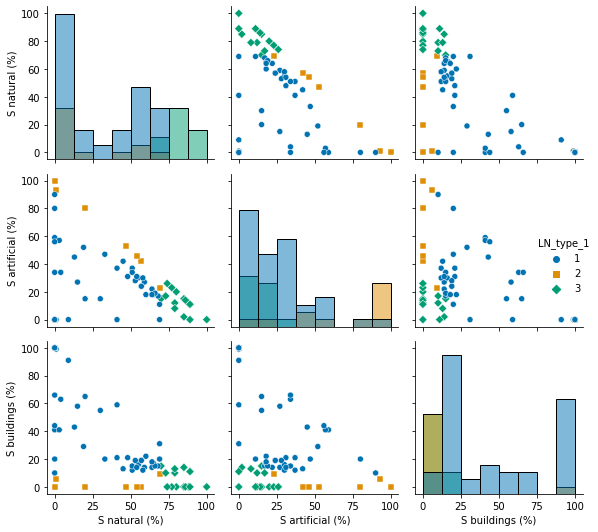

In [6]:
g = sns.pairplot(df[df.columns[[1,2,3,4]]], hue="LN_type_1", diag_kind='hist', markers=["o","s","D"], palette='colorblind')
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\colors_pairgrid")
plt.tight_layout()

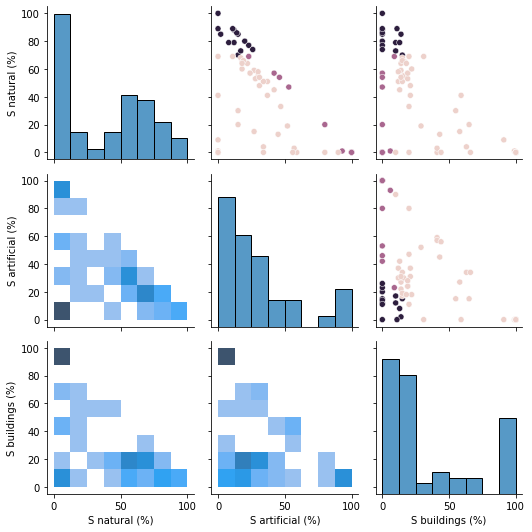

In [7]:
g = sns.PairGrid(df[df.columns[[2,3,4]]])
g.map_upper(sns.scatterplot, hue=df[df.columns[1]])
g.map_lower(sns.histplot)
g.map_diag(sns.histplot)
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\LN")

### Строительное назначение

In [8]:
buildings_df = df[df.columns[[13,6]]]
a = buildings_df.groupby(buildings_df.columns[1]).sum()
s_sum = df['S (sqm)'].sum()
k = np.array(a / s_sum)

buildings_df = df.loc[df['P_buildings_index'] == 3][df.columns[[13,-1]]]
a = buildings_df.groupby(buildings_df.columns[1]).sum()
s_sum = df.loc[df['P_buildings_index'] == 3]['S (sqm)'].sum()
p = np.array(a / s_sum)

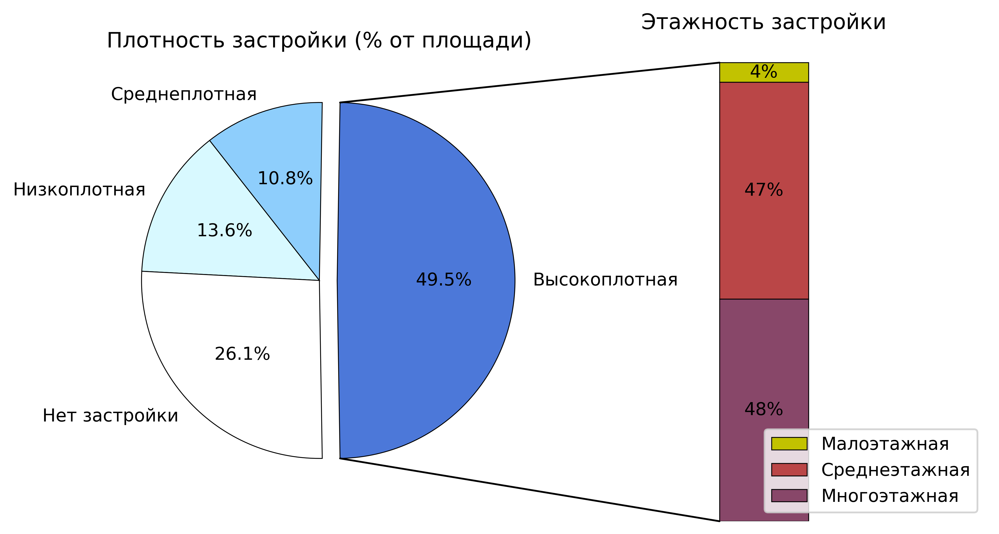

In [9]:
from matplotlib.patches import ConnectionPatch

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 5), dpi=500)
fig.subplots_adjust(wspace=0)

# pie chart parameters
overall_ratios = k[3][0], k[2][0], k[1][0], k[0][0]
labels = ['Высокоплотная', 'Среднеплотная', 'Низкоплотная', 'Нет застройки']
explode = [0.1,0,0,0]
angle = -180 * overall_ratios[0]
wedges, *_ = ax1.pie(overall_ratios, autopct='%1.1f%%', startangle=angle,
                     labels=labels, explode=explode, colors=['#4c78d9', '#8ecefc','#d8f9ff', '#ffffff'], wedgeprops = {'linewidth': .5, 'edgecolor': 'black'})
ax1.set_title('Плотность застройки (% от площади)')

# bar chart parameters
age_ratios = p[2][0], p[1][0], p[0][0]
age_labels = ['Многоэтажная', 'Среднеэтажная', 'Малоэтажная']
bottom = 1
width = .2

colors = ['#c2c200', '#ba4647','#884769']
# Adding from the top matches the legend.
for j, (height, label) in enumerate(reversed([*zip(age_ratios, age_labels)])):
    bottom -= height
    bc = ax2.bar(0, height, width, bottom=bottom, color=colors[j], label=label, **{'linewidth': .5, 'edgecolor': 'black'})
    ax2.bar_label(bc, labels=[f"{height:.0%}"], label_type='center')

ax2.set_title('Этажность застройки')
ax2.legend()
ax2.axis('off')
ax2.set_xlim(- 2.5 * width, 2.5 * width)

# use ConnectionPatch to draw lines between the two plots
theta1, theta2 = wedges[0].theta1, wedges[0].theta2
center, r = wedges[0].center, wedges[0].r
bar_height = sum(age_ratios)

# draw top connecting line
x = r * np.cos(np.pi / 180 * theta2) + center[0]
y = r * np.sin(np.pi / 180 * theta2) + center[1]
con = ConnectionPatch(xyA=(-width / 2, bar_height), coordsA=ax2.transData,
                      xyB=(x, y), coordsB=ax1.transData)
con.set_color([0, 0, 0])
con.set_linewidth(1)
ax2.add_artist(con)

# draw bottom connecting line
x = r * np.cos(np.pi / 180 * theta1) + center[0]
y = r * np.sin(np.pi / 180 * theta1) + center[1]
con = ConnectionPatch(xyA=(-width / 2, 0), coordsA=ax2.transData,
                      xyB=(x, y), coordsB=ax1.transData)
con.set_color([0, 0, 0])
ax2.add_artist(con)
con.set_linewidth(1)
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\pie_buildings")

,№,LN_type_1,S natural (%),S artificial (%),S buildings (%),P buildings (sqm/ha),P_buildings_index,floors_cnt,S commercial_FN (%),S resid_FN (%),S industry_FN (%),S resid (sqm),S non-resid (sqm),S (sqm)
№,1.000000,0.288020,0.103155,0.073920,-0.154896,-0.222110,-0.240824,-0.295965,-0.098472,-0.176881,-0.081489,-0.061679,-0.233563,-0.094440
LN_type_1,0.288020,1.000000,0.551257,0.014592,-0.513109,-0.534863,-0.637672,-0.288989,-0.123096,-0.127866,-0.330496,-0.020548,-0.104563,0.057835
S natural (%),0.103155,0.551257,1.000000,-0.330358,-0.642849,0.052108,-0.128825,0.353737,-0.135875,0.483337,-0.551227,0.418293,-0.060162,0.409027
S artificial (%),0.073920,0.014592,-0.330358,1.000000,-0.510553,-0.307220,-0.503793,-0.081582,-0.082948,-0.084090,-0.337661,-0.036312,0.032332,-0.023711
S buildings (%),-0.154896,-0.513109,-0.642849,-0.510553,1.000000,0.200547,0.525908,-0.256847,0.193097,-0.371620,0.775974,-0.351135,0.031255,-0.352275
P buildings (sqm/ha),-0.222110,-0.534863,0.052108,-0.307220,0.200547,1.000000,0.821034,0.780353,0.056344,0.536121,0.008969,0.427346,0.190141,0.125884
P_buildings_index,-0.240824,-0.637672,-0.128825,-0.503793,0.525908,0.821034,1.000000,0.567541,0.026144,0.446421,0.343861,0.164574,0.137006,0.001108
floors_cnt,-0.295965,-0.288989,0.353737,-0.081582,-0.256847,0.780353,0.567541,1.000000,-0.113365,0.786477,-0.341463,0.538775,0.122686,0.252372
S commercial_FN (%),-0.098472,-0.123096,-0.135875,-0.082948,0.193097,0.056344,0.026144,-0.113365,1.000000,-0.228659,-0.206510,-0.065601,0.186119,-0.057690
S resid_FN (%),-0.176881,-0.127866,0.483337,-0.084090,-0.371620,0.536121,0.446421,0.786477,-0.228659,1.000000,-0.453067,0.499401,0.035925,0.415116


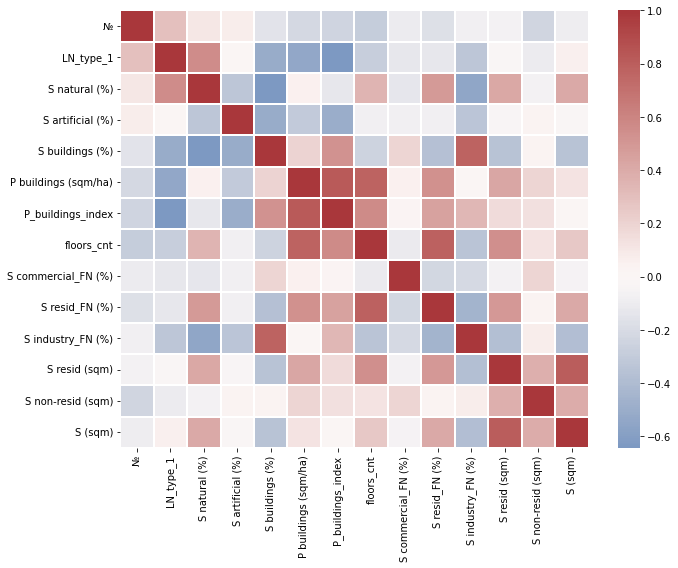

In [10]:
from sklearn.preprocessing import scale
import seaborn as sns

df1 = pd.DataFrame(scale(df[df.columns[:-5]]))
correlation_numbers = df1.corr()
correlation = correlation_numbers.rename(columns_names, axis='index').rename(columns_names, axis='columns')
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(correlation, cmap='vlag',center=0,linewidths=.2)
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\correlation")
correlation

In [17]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

# сбор корреляций > 0.51

c = 0
listik = []
for i in range(14):
    for k in range(1+i, 14):
        if abs(correlation_numbers[i].T[k]) > 0.51:
            listik.append([i,k,c])
            c += 1
            
# построение графиков

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15), dpi=500)
for i, k, idx in listik:
    ax = axes[idx // 4, idx % 4]
    linspace = np.linspace(min(df[df.columns[i]]) - 0.1*max(df[df.columns[i]]), 1.1*max(df[df.columns[i]]), 50)[:, np.newaxis]
    X = df[[df.columns[i]]]
    y = df[df.columns[k]]
    X_test = linspace.reshape(-1,1)
    
    '''
    svr = SVR(gamma=10).fit(X, y)
    ax.plot(X_test, svr.predict(X_test))
    '''
    
    poly = PolynomialFeatures(degree=4, include_bias=False)
    poly.fit(X.values)
    X_poly = poly.transform(X.values)
    line_poly = poly.transform(X_test)
    reg = LinearRegression().fit(X_poly, y)
    y_te = reg.predict(line_poly)
    y_tr = reg.predict(X_poly)
    
    #mean_squared_error(y_true, y_pred, squared=False)
    
    ax.plot(X_test, y_te, label='polynomial linear regression', color='red')
    d = ax.hist2d(X.iloc[:,0], y, bins=9, cmin=1, weights=df.iloc[:,13] / 10000, cmap='Blues')
    ax.set_xlim(min(df[df.columns[i]]) - 0.1*max(df[df.columns[i]]), 1.1*max(df[df.columns[i]]))
    ax.set_ylim(min(df[df.columns[k]]) - 0.1*max(df[df.columns[k]]), 1.1*max(df[df.columns[k]]))
    ax.set_title(label="corr=" + str(round(correlation_numbers[i].T[k], 2)) + " r_sq_weighted=" + str(round(r2_score(y,y_tr,sample_weight=df.iloc[:,13]),2)))
    #ax.set_title(label="corr=" + str(round(correlation_numbers[i].T[k], 2)) + " r_sq=" + str(round(r2_score(y,y_tr),2)))
    ax.set_xlabel(df.columns[i])
    ax.set_ylabel(df.columns[k])
    
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\corr_regression_sqm")

In [18]:
from sklearn.metrics import r2_score

# построение графиков

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15), dpi=500)
for i, k, idx in listik:
    ax = axes[idx // 4, idx % 4]
    linspace = np.linspace(min(df[df.columns[i]]) - 0.1*max(df[df.columns[i]]), 1.1*max(df[df.columns[i]]), 73)[:, np.newaxis]
    X = df[[df.columns[i]]]
    y = df[df.columns[k]]
    X_test = linspace.reshape(-1,1)
    
    poly = PolynomialFeatures(degree=4, include_bias=False)
    poly.fit(X.values)
    X_poly = poly.transform(X.values)
    line_poly = poly.transform(X_test)
    reg = LinearRegression().fit(X_poly, y)
    y_te = reg.predict(line_poly)
    y_tr = reg.predict(X_poly)
    
    ax.plot(X_test, y_te, label='polynomial linear regression', color='red')
    
    X_ = sm.add_constant(X)
    model = sm.OLS(y,X_)
    results = model.fit()
    r_sq = round(results.rsquared,2)
    
    ax.set_xlim(min(df[df.columns[i]]) - 0.1*max(df[df.columns[i]]), 1.1*max(df[df.columns[i]]))
    ax.set_ylim(min(df[df.columns[k]]) - 0.1*max(df[df.columns[k]]), 1.1*max(df[df.columns[k]]))
    #ax.set_title(label="corr=" + str(round(correlation_numbers[i].T[k], 2)) + " r_sq=" + str(round(r2_score(y,y_tr,sample_weight=df.iloc[:,13]),2)))
    ax.set_title(label="corr=" + str(round(correlation_numbers[i].T[k], 2)) + " r_sq=" + str(round(r2_score(y,y_tr),2)))
    ax.set_xlabel(df.columns[i])
    ax.set_ylabel(df.columns[k])
    ax.scatter(df[df.columns[i]], df[df.columns[k]], color='black')


plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\corr_regression_cnt")

In [19]:
indexes = pd.read_csv(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\204_5_Сводная индекс - Индексы.csv", encoding='utf-8')
indexes = indexes.fillna(0)
indexes['Площадь'] = indexes['Площадь'] / 10000
indexes.head()

,№ ЗУ,Ландшафтное (вид),Ландшафтное (тип),Строительное (вид),Высота (вид),Плотность (вид),Функциональное (вид),Площадь
0,1,1023,102,301026,301,3,2002,0.758239
1,2,2011,201,0,0,0,3004,0.150830
2,3,1011,101,101005,101,1,1004,0.193465
3,4,1023,102,302028,302,3,2002,0.672986
4,5,1011,101,100014,100,3,3004,0.028001


In [24]:
c = 0
indexes_only = indexes.drop(indexes.columns[[0,2,3]], axis=1)

labels = ['G1', 'G2', 'G3', 'G4', 'G5']
x = np.arange(len(labels))
men_means = [20, 34, 30, 35, 27]
women_means = [25, 32, 34, 20, 25]
width = 0.3


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(25, 25), dpi=500)
for i in range(4):
    for k in range(i + 1, 4):
        # upper right corner - ha
        ax = axes[c + 1 - 2 * (c // 3) - c // 5, c // 3 + c // 5]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[k]], columns=indexes_only[indexes_only.columns[i]], values='Площадь', aggfunc=sum)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='mako_r', linewidths=1, vmin=1, annot=True, ax=ax, cbar=False)
        ax.set_title("Площадь участков (га)")
        
        # lower left corner - number
        ax = axes[c // 3 + c // 5, c + 1 - 2 * (c // 3) - c // 5]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[i]], columns=indexes_only[indexes_only.columns[k]], values='Ландшафтное (вид)', aggfunc=len)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='rocket_r', linewidths=1, vmin=1, annot=True, ax=ax, cbar=False) 
        ax.set_title("Количество участков (шт.)")
        c += 1
        
    # diag
    ax = axes[i,i]
    a = np.array(indexes_only.groupby(indexes_only.columns[i]).sum()['Площадь'])
    b = np.array(indexes_only.groupby(indexes_only.columns[i]).size())

    labels = sorted(list(set(indexes_only[indexes_only.columns[i]])))
    x = np.arange(len(labels))
    men_means = a
    women_means = b
    width = 0.35

    ax2 = ax.twinx()
    ax2.bar(x - width/2, men_means, width, label='Площадь (га)', color='pink')
    ax.bar(x + width/2, women_means, width, label='Кол-во (шт.)', color='lightgreen')
    ax.set_xticks(x, labels)
    ax.set_title(indexes_only.columns[i])
    ax2.legend(loc=2)
    ax.legend(loc=1)
    
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\heatmaps_2")

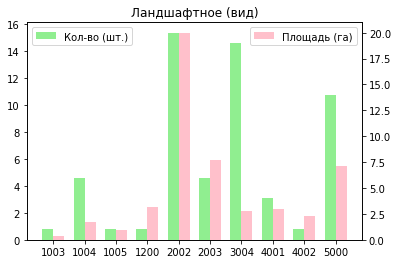

In [25]:
a = np.array(indexes_only.groupby(indexes_only.columns[i]).sum()['Площадь'])
b = np.array(indexes_only.groupby(indexes_only.columns[i]).size())

labels = sorted(list(set(indexes_only[indexes_only.columns[i]])))
x = np.arange(len(labels))
men_means = a
women_means = b
width = 0.35

i = 0
#ax = axes[i,i]
fig, ax = plt.subplots()
ax2 = ax.twinx()
ax.bar(x + width/2, men_means, width, label='Площадь (га)', color='pink')
ax2.bar(x - width/2, women_means, width, label='Кол-во (шт.)', color='lightgreen')
ax.set_xticks(x, labels)
ax.set_title(indexes_only.columns[i])
ax.legend(loc=1)
ax2.legend(loc=2)
plt.show()

# Do not look down please
### help for team 3 in case of emergency

In [38]:
from sklearn.linear_model import RidgeClassifierCV

y = df[[df.columns[1]]]
X = df1[df1.columns[2:]]

alphas = np.arange(1, 100, 5)
model_ridgecv = RidgeClassifierCV(cv=3, alphas=alphas)
model_ridgecv.fit(X, y)
y_tr = model_ridgecv.predict(X)
print(model_ridgecv.coef_)
model_ridgecv.score(X,y)

c:\users\egorb\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[[ 0.04849134 -0.10207309  0.04312945 -0.05541191  0.10217121 -0.00241283
  -0.06725181 -0.06713982 -0.06094468 -0.11311082  0.03207993  0.06033267
  -0.76683003  0.04064791  0.0406339  -0.1569118 ]
 [-0.18415247  0.29159963 -0.08205994  0.06391495 -0.09735424 -0.07048498
   0.19369202  0.2067661   0.17499097  0.18163735 -0.07244525 -0.04954401
   0.13367043 -0.00219298 -0.00216291  0.34783052]
 [ 0.13566113 -0.18952653  0.03893049 -0.00850304 -0.00481697  0.07289781
  -0.12644021 -0.13962627 -0.11404629 -0.06852653  0.04036531 -0.01078865
   0.6331596  -0.03845493 -0.03847099 -0.19091872]]


0.958904109589041

In [39]:
from sklearn.model_selection import train_test_split

X = df[df.columns[5::]] 
y = df[df.columns[1]]
X_tr, X_te, y_tr, y_te = train_test_split(X, y)
X_tr.shape, X_te.shape

((54, 13), (19, 13))

In [40]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler().fit(X_tr)
X_tr_transformed = scaler.transform(X_tr)
X_te_transformed = scaler.transform(X_te)

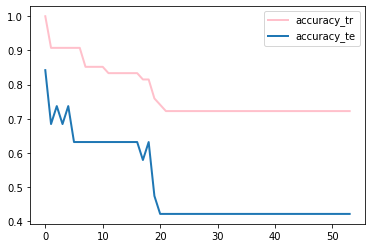

In [41]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

accuracy_tr = []
accuracy_te = []
for i in range(1, len(X_tr)+1):
    model_knn = KNeighborsClassifier(n_neighbors=i)
    model_knn.fit(X_tr_transformed, y_tr)
    preds_tr = model_knn.predict(X_tr_transformed)
    preds_te = model_knn.predict(X_te_transformed)
    accuracy_tr.append(accuracy_score(y_tr, preds_tr))
    accuracy_te.append(accuracy_score(y_te, preds_te))

fig, ax = plt.subplots()
ax.plot(np.arange(0,len(X_tr),1), accuracy_tr, linewidth=2.0, label='accuracy_tr', color='pink')
ax.plot(np.arange(0,len(X_tr),1), accuracy_te, linewidth=2.0, label='accuracy_te')
plt.legend()
plt.show()

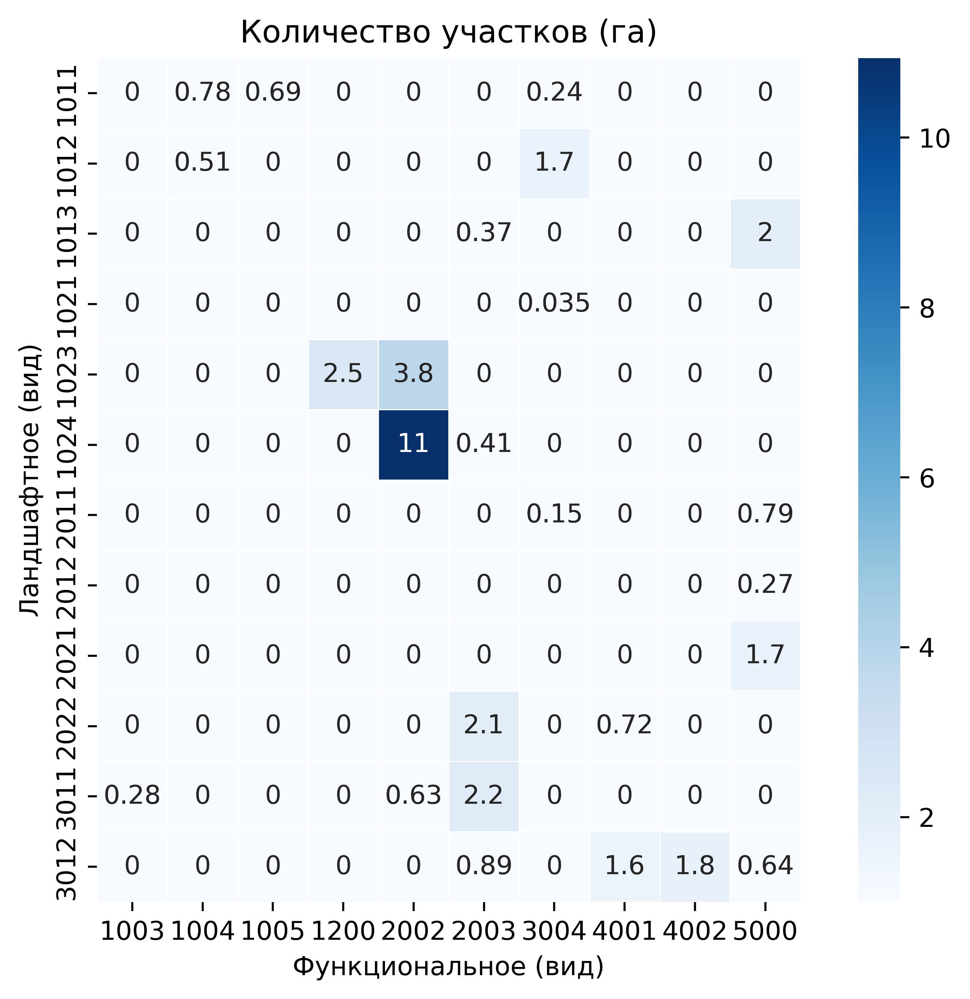

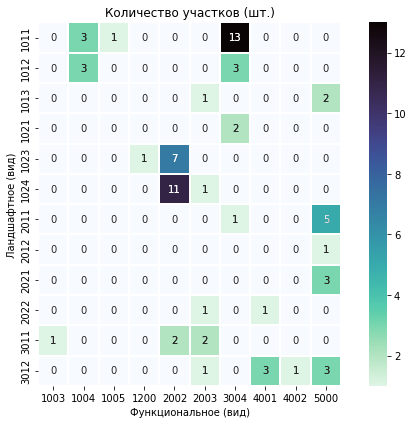

In [20]:
pivot = pd.pivot_table(indexes, index=indexes[indexes.columns[1]], columns=indexes[indexes.columns[6]], values='Площадь', aggfunc=sum)
fig, ax = plt.subplots(figsize=(8, 6), dpi=500)
pivot_clean = pivot.fillna(0)
ax = sns.heatmap(pivot_clean, cmap='Blues', linewidths=.2, vmin=0, annot=True, square=True, cbar=False)
ax = sns.heatmap(pivot, cmap='Blues', linewidths=.2, vmin=1, annot=True, square=True)
ax.set_title("Количество участков (га)")

pivot_1 = pd.pivot_table(indexes, index=indexes[indexes.columns[1]], columns=indexes[indexes.columns[6]], values='Площадь', aggfunc=len)
fig, ax = plt.subplots(figsize=(8, 6))
pivot_clean_1 = pivot_1.fillna(0)
ax = sns.heatmap(pivot_clean_1, cmap='Blues', linewidths=.2, vmin=0, annot=True, square=True, cbar=False)
ax = sns.heatmap(pivot_1, cmap='mako_r', linewidths=.2, vmin=1, annot=True, square=True)
ax.set_title("Количество участков (шт.)")
plt.tight_layout()

plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\heatmap_0")

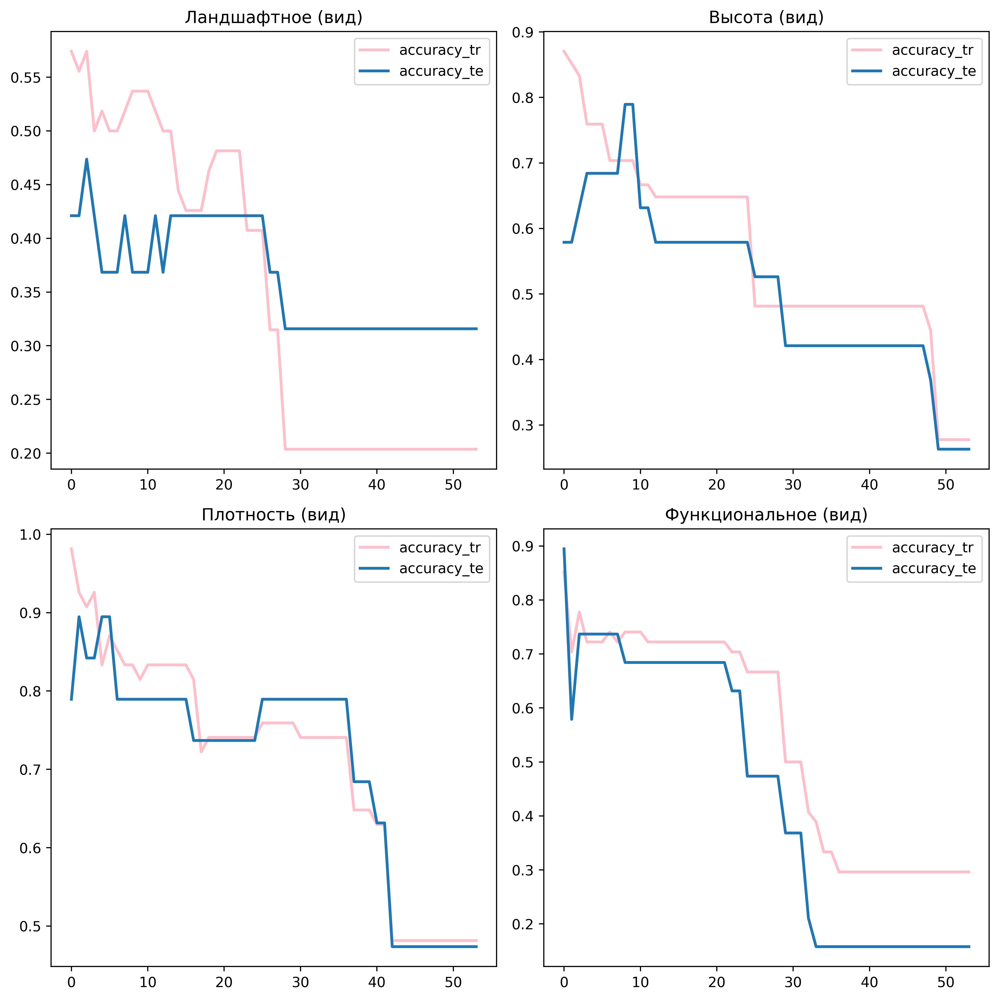

In [42]:
from sklearn.model_selection import cross_val_score

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=500)
for i in range(4):
    listik_1 = [0,1,2,3]
    listik_1.pop(i)
    X = indexes_only[indexes_only.columns[listik_1]] 
    y = indexes_only[indexes_only.columns[i]]
    X_tr, X_te, y_tr, y_te = train_test_split(X, y)
    
    scaler = StandardScaler().fit(X_tr)
    X_tr_transformed = scaler.transform(X_tr)
    X_te_transformed = scaler.transform(X_te)

    accuracy_tr = []
    accuracy_te = []
    for k in range(1, len(X_tr)+1):
        model_knn = KNeighborsClassifier(n_neighbors=k)
        model_knn.fit(X_tr_transformed, y_tr)
        preds_tr = model_knn.predict(X_tr_transformed)
        preds_te = model_knn.predict(X_te_transformed)
        accuracy_tr.append(accuracy_score(y_tr, preds_tr))
        accuracy_te.append(accuracy_score(y_te, preds_te))
    
    ax = axes[i // 2, i % 2]
    ax.plot(np.arange(0,len(X_tr),1), accuracy_tr, linewidth=2.0, label='accuracy_tr', color='pink')
    ax.plot(np.arange(0,len(X_tr),1), accuracy_te, linewidth=2.0, label='accuracy_te')
    ax.legend()
    ax.set_title(indexes_only.columns[i])
plt.tight_layout()

In [455]:
indexes_1 = pd.read_csv(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\204_сводная - Сводная (копия).csv", encoding='utf-8')
indexes_1 = indexes.fillna(0)
indexes_1.head()

,№ ЗУ,Ландшафтное (вид),Ландшафтное (тип),Строительное (вид),Высота (вид),Плотность (вид),Функциональное (вид),Площадь
0,1,1023,102,301026,301,3,2002,0.758239
1,2,2011,201,0,0,0,3004,0.150830
2,3,1011,101,101005,101,1,1004,0.193465
3,4,1023,102,302028,302,3,2002,0.672986
4,5,1011,101,100014,100,3,3004,0.028001


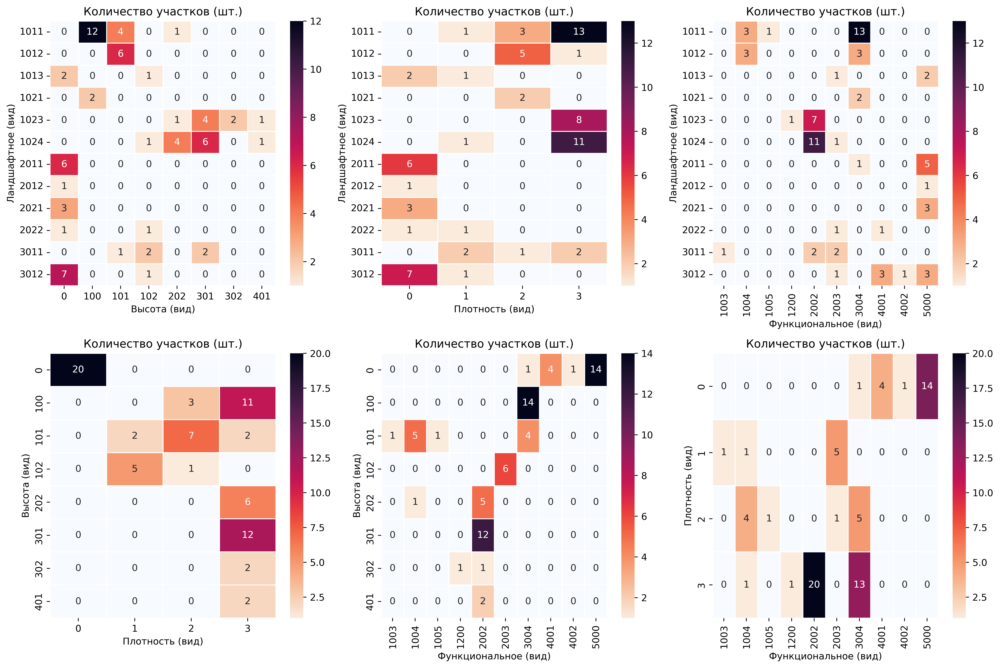

In [22]:
c = 0
indexes_only = indexes.drop(indexes.columns[[0,2,3,7]], axis=1)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10), dpi=500)
for i in range(4):
    for k in range(i + 1,4):
        ax = axes[c // 3, c % 3]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[i]], columns=indexes_only[indexes_only.columns[k]], values='Ландшафтное (вид)', aggfunc=len)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='rocket_r', linewidths=1, vmin=1, annot=True, ax=ax) 
        c += 1
        ax.set_title("Количество участков (шт.)")
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\heatmaps_1")

In [458]:
c = 0
indexes_only = indexes_1.drop(indexes.columns[[0,1,3]], axis=1)

labels = ['G1', 'G2', 'G3', 'G4', 'G5']
x = np.arange(len(labels))
men_means = [20, 34, 30, 35, 27]
women_means = [25, 32, 34, 20, 25]
width = 0.3


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(25, 25), dpi=500)
for i in range(4):
    for k in range(i + 1, 4):
        # upper right corner - ha
        ax = axes[c // 3 + c // 5, c + 1 - 2 * (c // 3) - c // 5]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[i]], columns=indexes_only[indexes_only.columns[k]], values='Площадь', aggfunc=sum)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='mako_r', linewidths=1, vmin=1, annot=True, ax=ax, cbar=False)
        ax.set_title("Площадь участков (га)")
        
        # lower left corner - number
        ax = axes[c + 1 - 2 * (c // 3) - c // 5, c // 3 + c // 5]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[k]], columns=indexes_only[indexes_only.columns[i]], values='Ландшафтное (вид)', aggfunc=len)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='rocket_r', linewidths=1, vmin=1, annot=True, ax=ax, cbar=False) 
        ax.set_title("Количество участков (шт.)")
        c += 1
        
    # diag
    ax = axes[i,i]
    a = np.array(indexes_only.groupby(indexes_only.columns[i]).sum()['Площадь'])
    b = np.array(indexes_only.groupby(indexes_only.columns[i]).size())

    labels = sorted(list(set(indexes_only[indexes_only.columns[i]])))
    x = np.arange(len(labels))
    men_means = a
    women_means = b
    width = 0.35

    ax2 = ax.twinx()
    ax2.bar(x - width/2, men_means, width, label='Площадь (га)', color='pink')
    ax.bar(x + width/2, women_means, width, label='Кол-во (шт.)', color='lightgreen')
    ax.set_xticks(x, labels)
    ax.set_title(indexes_only.columns[i])
    ax2.legend(loc=2)
    ax.legend(loc=1)
    
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\heatmaps_3")

KeyError: 'Ландшафтное (вид)'

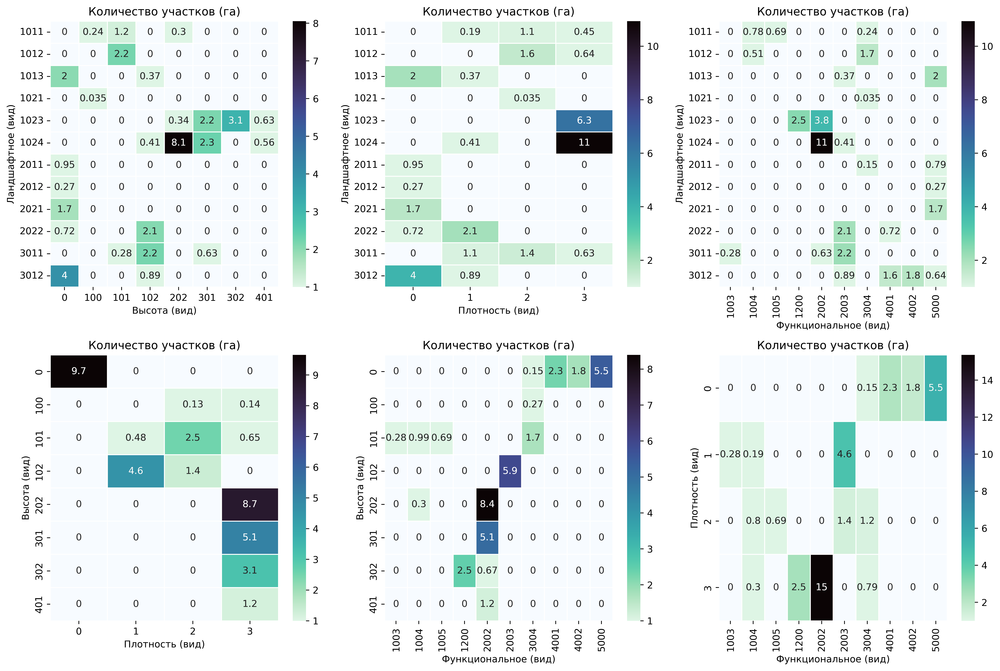

In [21]:
c = 0
indexes_only = indexes.drop(indexes.columns[[0,2,3]], axis=1)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10), dpi=500)
for i in range(4):
    for k in range(i + 1, 4):
        ax = axes[c // 3, c % 3]
        pivot = pd.pivot_table(indexes_only, index=indexes_only[indexes_only.columns[i]], columns=indexes_only[indexes_only.columns[k]], values='Площадь', aggfunc=sum)
        pivot_clean = pivot.fillna(0)
        sns.heatmap(pivot_clean, cmap='Blues', linewidths=1, vmin=0, annot=True, cbar=False, ax=ax)
        sns.heatmap(pivot, cmap='mako_r', linewidths=1, vmin=1, annot=True, ax=ax) 
        c += 1
        ax.set_title("Количество участков (га)")
plt.tight_layout()
plt.savefig(r"C:\Users\egorb\Documents\ГП\2 курс\ПроектСем\4 module\plots\heatmaps_1")